In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!


def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

C:\Users\ratchainanttha\Anaconda3\envs\dl\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# The Generator

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN, 
        corresponding to a transposed convolution, a batchnorm (except for in the last layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''

        #     Steps:
        #       1) Do a transposed convolution using the given parameters.
        #       2) Do a batchnorm, except for the last layer.
        #       3) Follow each batchnorm with a ReLU activation.
        #       4) If its the final layer, use a Tanh activation after the deconvolution.

        # Build the neural block
        if not final_layer:
            return nn.Sequential(nn.ConvTranspose2d(input_channels, output_channels, kernel_size=kernel_size, stride=stride),
                                 nn.BatchNorm2d(output_channels),
                                 nn.ReLU(inplace=True))
        else: # Final Layer
            return nn.Sequential(nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride), 
                                 nn.Tanh())

    def unsqueeze_noise(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns a copy of that noise with width and height = 1 and channels = z_dim.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return noise.view(len(noise), self.z_dim, 1, 1)

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = self.unsqueeze_noise(noise)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

The Discriminator

In [3]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
    hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=16):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of DCGAN, 
        corresponding to a convolution, a batchnorm (except for in the last layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        #     Steps:
        #       1) Add a convolutional layer using the given parameters.
        #       2) Do a batchnorm, except for the last layer.
        #       3) Follow each batchnorm with a LeakyReLU activation with slope 0.2.
        #       Note: Don't use an activation on the final layer
        
        # Build the neural block
        if not final_layer:
            return nn.Sequential(nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                                 nn.BatchNorm2d(output_channels),
                                 nn.LeakyReLU(0.2, inplace=True))
        else: # Final Layer
            return nn.Sequential(nn.Conv2d(input_channels, output_channels, kernel_size, stride), nn.Sigmoid())

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

# Training Configuration

In [4]:
criterion = nn.BCEWithLogitsLoss()
z_dim = 64
display_step = 500
batch_size = 128
# A learning rate of 0.0002 works well on DCGAN
lr = 0.0002

# These parameters control the optimizer's momentum
beta_1 = 0.5 
beta_2 = 0.999
device = 'cuda'

# You can tranform the image values to be between -1 and 1 (the range of the tanh activation)
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,))])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

# Initialization  
Initialize the generator, discriminator and optimizer

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr, betas=(beta_1, beta_2))

# You initialize the weights to the normal distribution
# with mean 0 and standard deviation 0.02
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

# Learning

  6%|████▋                                                                            | 27/469 [00:00<00:11, 39.16it/s]

Epoch 1, step 500: Generator loss: 0.5532527681589126, discriminator loss: 0.6609729157686227


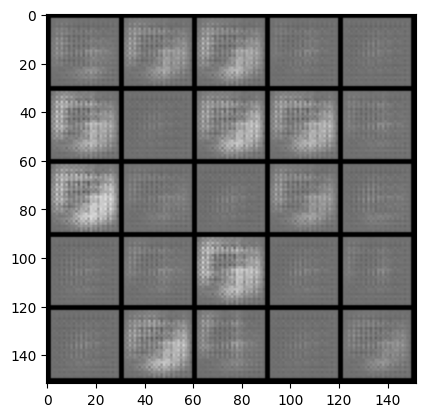

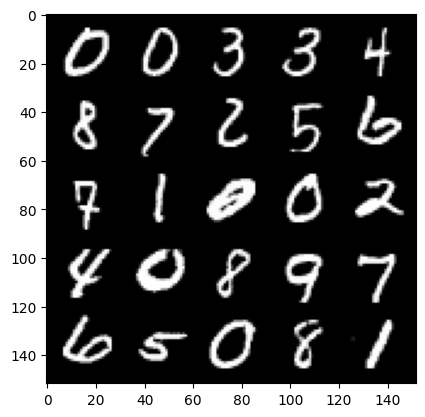

 12%|██████████                                                                       | 58/469 [00:01<00:10, 39.32it/s]

Epoch 2, step 1000: Generator loss: 0.6150475396513944, discriminator loss: 0.6266328407526018


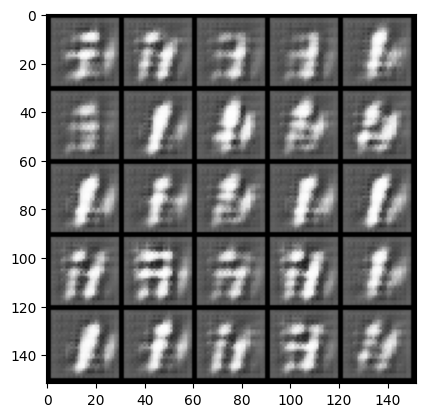

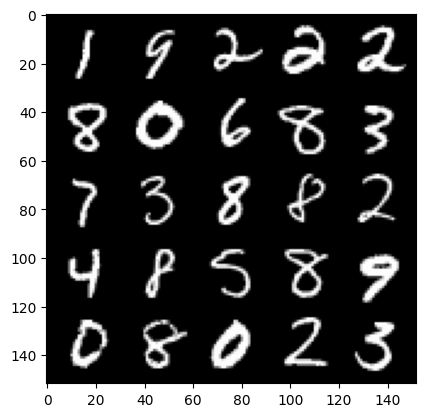

 19%|███████████████▋                                                                 | 91/469 [00:02<00:09, 39.60it/s]

Epoch 3, step 1500: Generator loss: 0.6320517984628682, discriminator loss: 0.6388934983015058


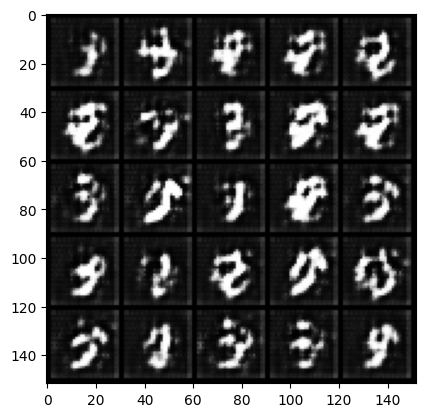

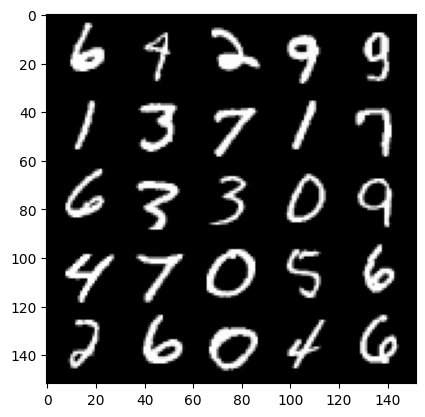

 26%|████████████████████▉                                                           | 123/469 [00:03<00:08, 40.55it/s]

Epoch 4, step 2000: Generator loss: 0.6288732815980916, discriminator loss: 0.6700355371236807


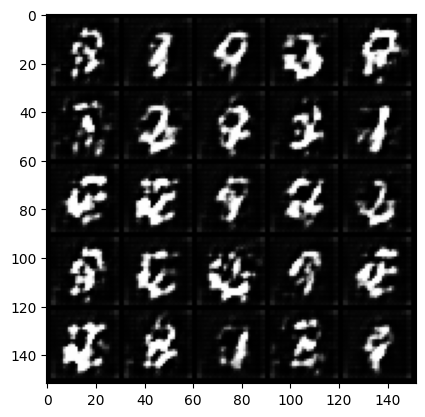

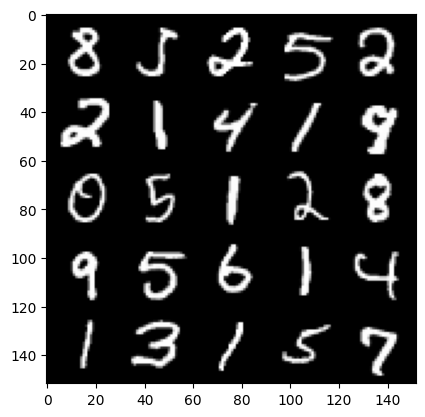

 33%|██████████████████████████▍                                                     | 155/469 [00:03<00:07, 40.32it/s]

Epoch 5, step 2500: Generator loss: 0.6186778330206871, discriminator loss: 0.6758935636281963


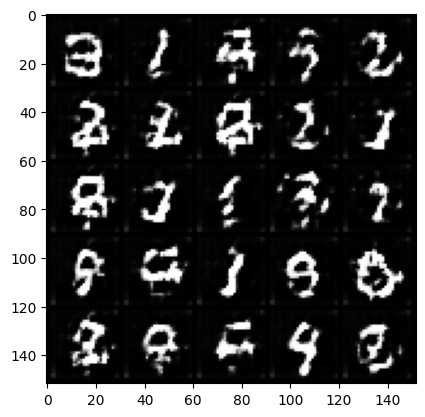

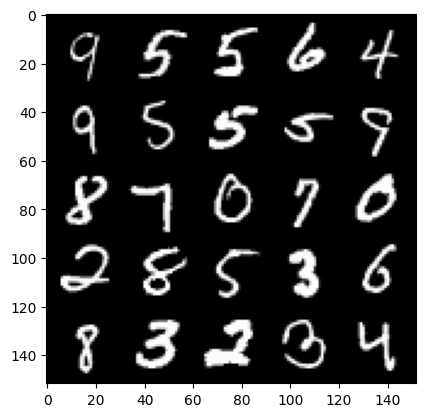

 39%|███████████████████████████████                                                 | 182/469 [00:04<00:07, 40.00it/s]

Epoch 6, step 3000: Generator loss: 0.6189872676134112, discriminator loss: 0.6818973019123074


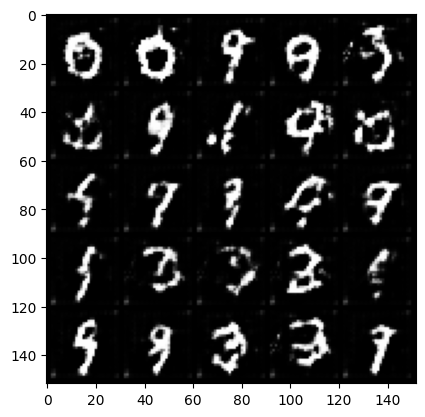

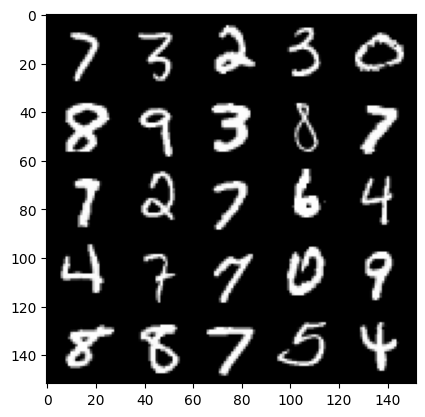

 46%|████████████████████████████████████▌                                           | 214/469 [00:05<00:06, 41.11it/s]

Epoch 7, step 3500: Generator loss: 0.6280700050592418, discriminator loss: 0.6866602209806443


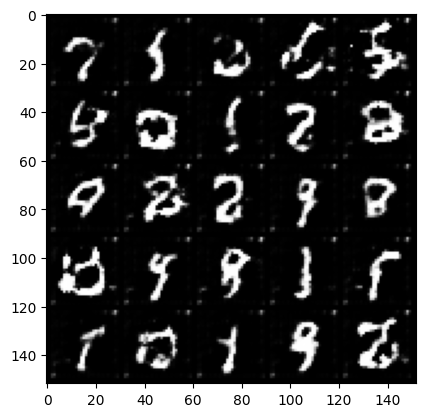

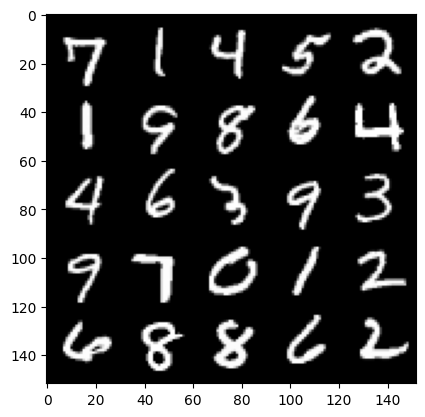

 52%|█████████████████████████████████████████▊                                      | 245/469 [00:06<00:05, 40.89it/s]

Epoch 8, step 4000: Generator loss: 0.6375879727602003, discriminator loss: 0.6889763990640639


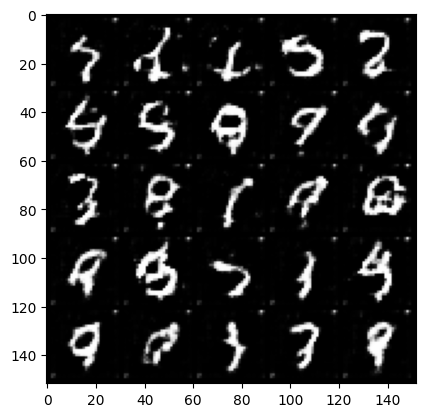

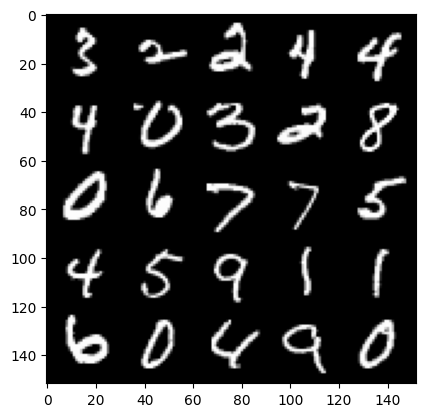

 59%|███████████████████████████████████████████████▏                                | 277/469 [00:06<00:04, 40.09it/s]

Epoch 9, step 4500: Generator loss: 0.6590070316791533, discriminator loss: 0.6914742375612262


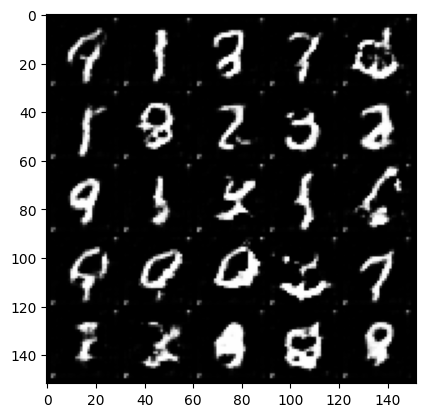

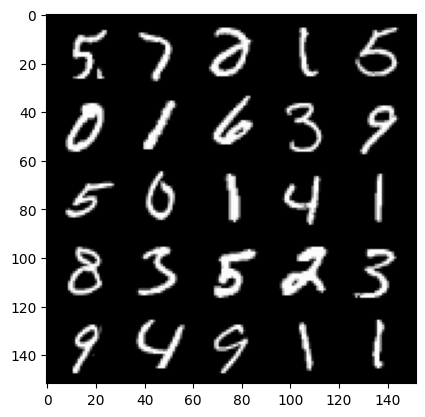

 65%|████████████████████████████████████████████████████▎                           | 307/469 [00:07<00:04, 38.74it/s]

Epoch 10, step 5000: Generator loss: 0.6616605167388917, discriminator loss: 0.6914102925062178


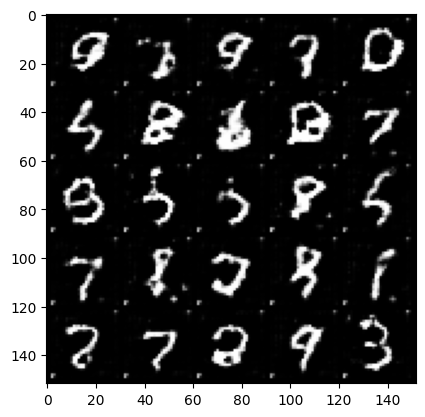

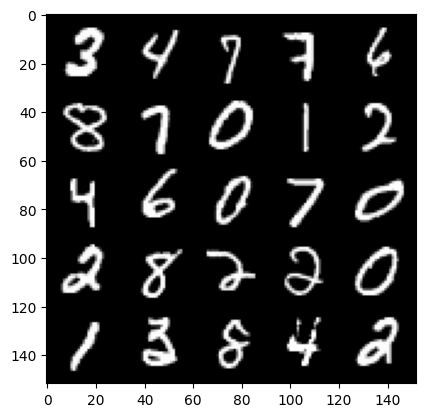

 72%|█████████████████████████████████████████████████████████▊                      | 339/469 [00:09<00:03, 39.22it/s]

Epoch 11, step 5500: Generator loss: 0.6816745260357865, discriminator loss: 0.6940254564285275


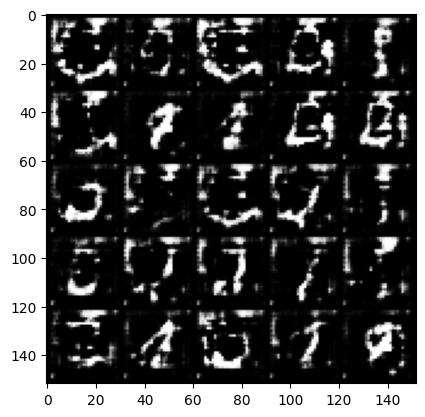

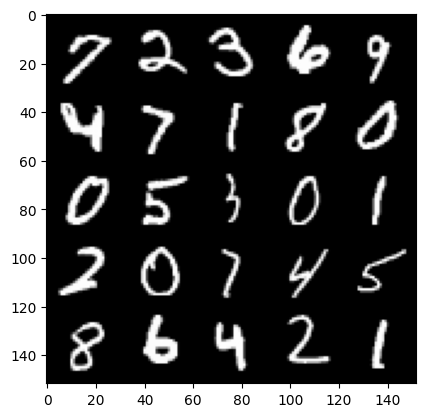

 79%|███████████████████████████████████████████████████████████████▎                | 371/469 [00:09<00:02, 38.91it/s]

Epoch 12, step 6000: Generator loss: 0.6761594996452326, discriminator loss: 0.6921721156835555


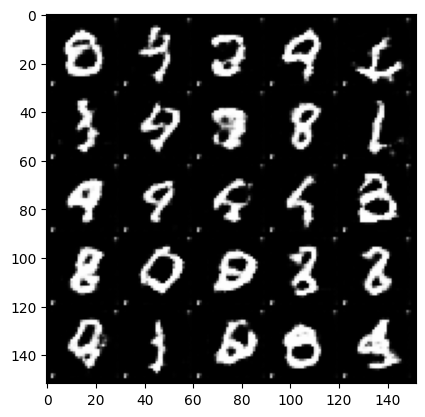

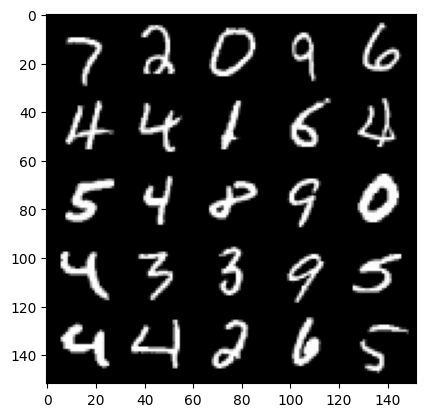

 86%|████████████████████████████████████████████████████████████████████▌           | 402/469 [00:10<00:01, 39.70it/s]

Epoch 13, step 6500: Generator loss: 0.6798092925548561, discriminator loss: 0.6923987221717833


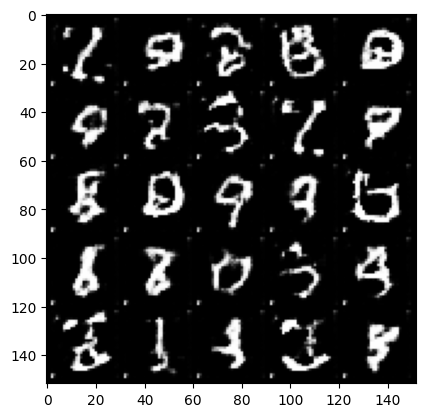

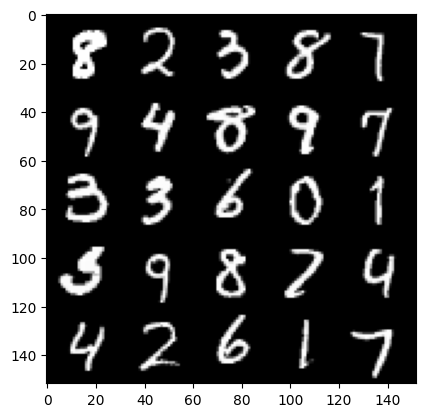

 92%|█████████████████████████████████████████████████████████████████████████▊      | 433/469 [00:11<00:00, 39.51it/s]

Epoch 14, step 7000: Generator loss: 0.6865860708951943, discriminator loss: 0.6929882191419596


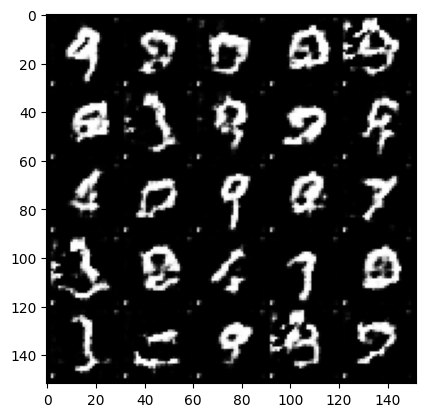

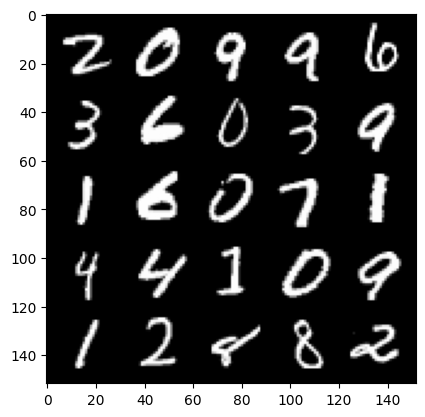

 98%|██████████████████████████████████████████████████████████████████████████████▋ | 461/469 [00:11<00:00, 38.85it/s]

Epoch 15, step 7500: Generator loss: 0.6843763976097107, discriminator loss: 0.6928546127080912


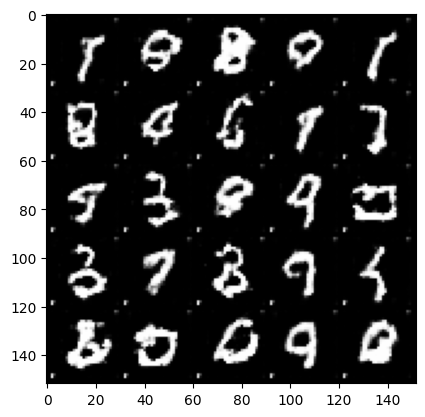

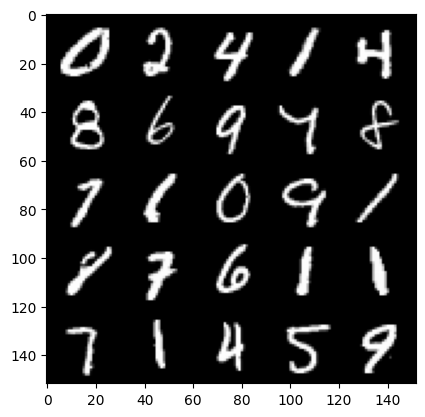

  5%|████▏                                                                            | 24/469 [00:00<00:12, 36.40it/s]

Epoch 17, step 8000: Generator loss: 0.6878492790460583, discriminator loss: 0.6930294188261029


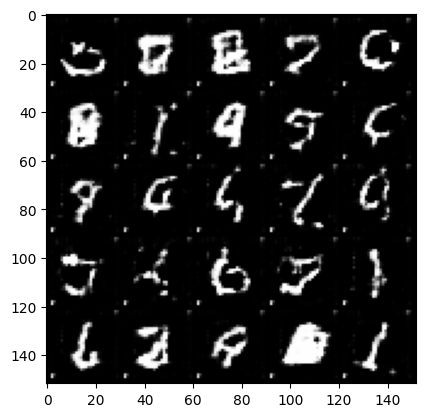

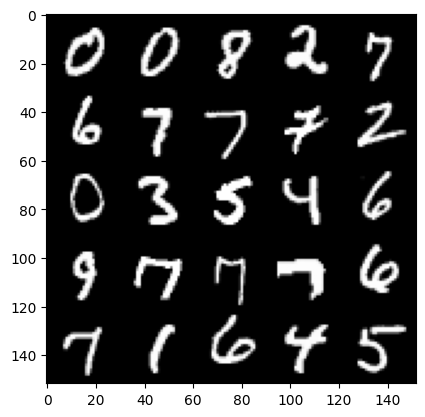

 12%|█████████▍                                                                       | 55/469 [00:01<00:10, 38.95it/s]

Epoch 18, step 8500: Generator loss: 0.691015098452568, discriminator loss: 0.6931039559841149


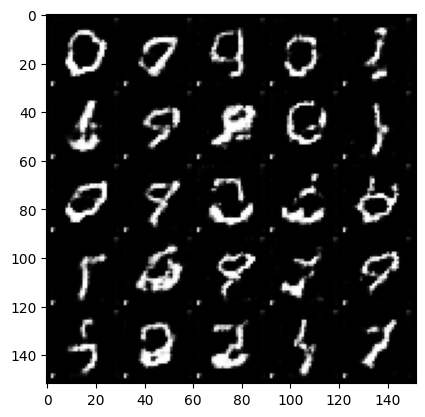

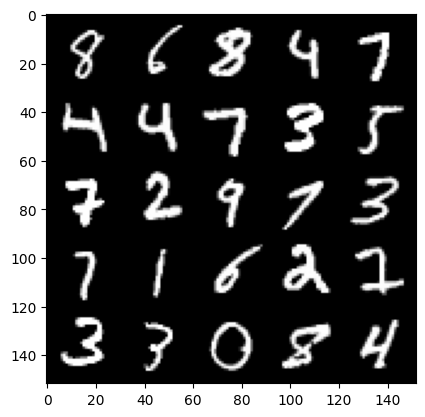

 19%|███████████████▎                                                                 | 89/469 [00:02<00:09, 39.10it/s]

Epoch 19, step 9000: Generator loss: 0.6931150842905046, discriminator loss: 0.6931569726467137


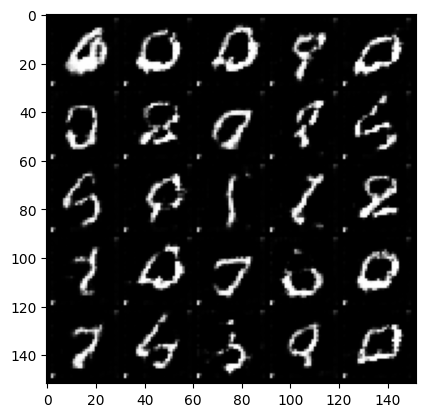

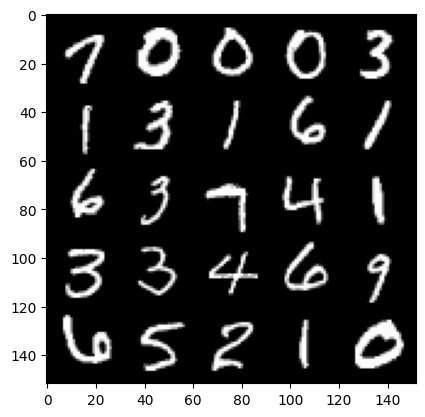

 25%|███████████████████▊                                                            | 116/469 [00:02<00:08, 40.20it/s]

Epoch 20, step 9500: Generator loss: 0.6923258646726619, discriminator loss: 0.6931525210142135


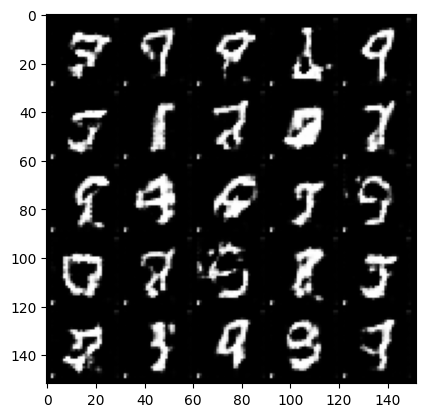

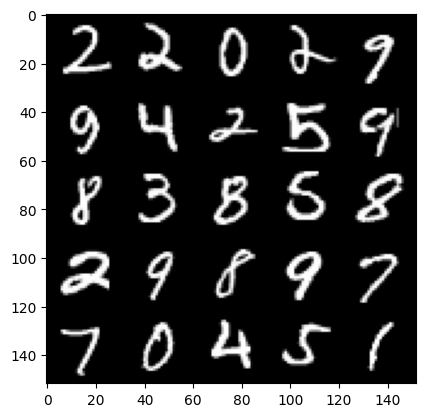

 32%|█████████████████████████▏                                                      | 148/469 [00:03<00:08, 38.07it/s]

Epoch 21, step 10000: Generator loss: 0.6917428679466248, discriminator loss: 0.6931611073017123


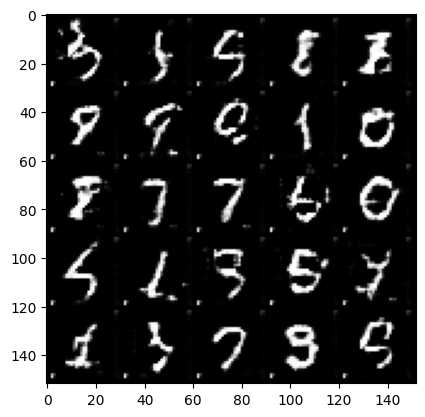

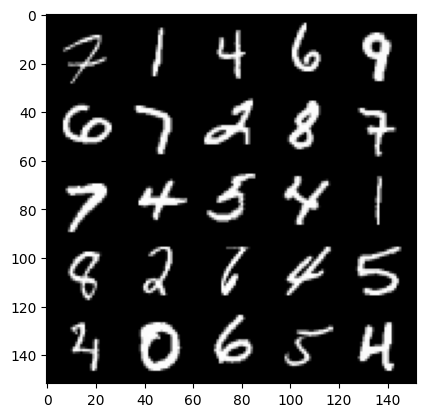

 39%|███████████████████████████████                                                 | 182/469 [00:04<00:07, 38.34it/s]

Epoch 22, step 10500: Generator loss: 0.6929853844642638, discriminator loss: 0.693188795566559


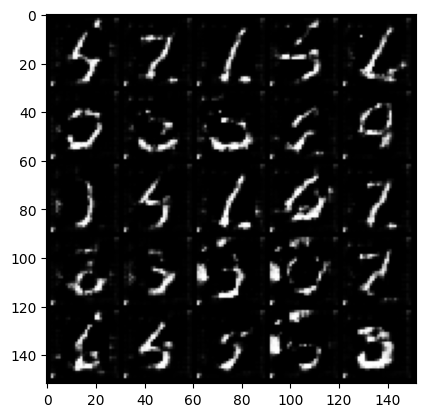

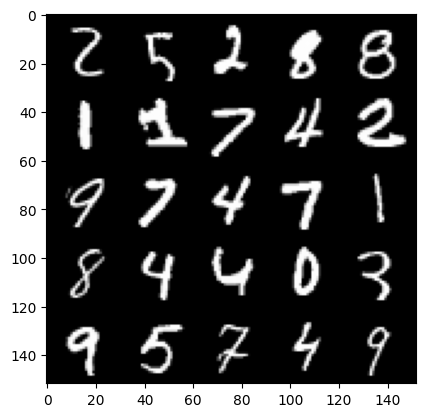

 45%|███████████████████████████████████▊                                            | 210/469 [00:05<00:06, 39.96it/s]

Epoch 23, step 11000: Generator loss: 0.6926535128355032, discriminator loss: 0.6931801098585126


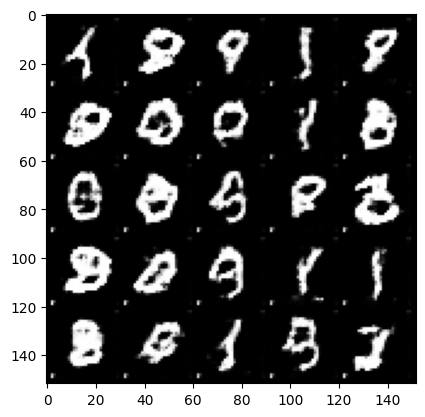

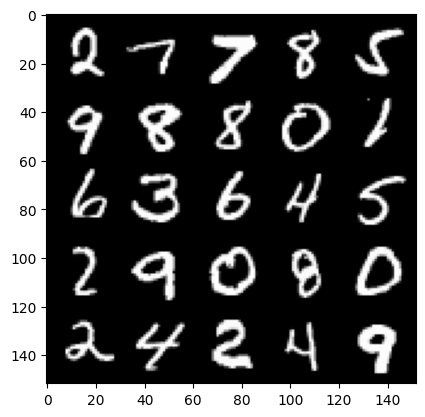

 52%|█████████████████████████████████████████▎                                      | 242/469 [00:06<00:05, 39.99it/s]

Epoch 24, step 11500: Generator loss: 0.6910200160741807, discriminator loss: 0.6931352623701088


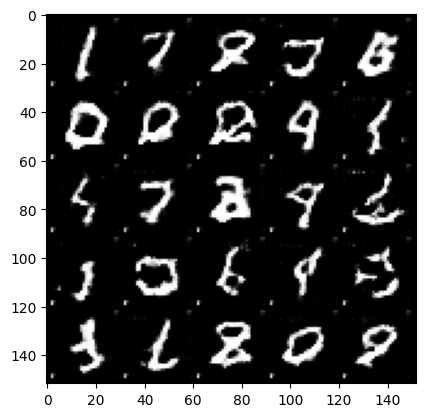

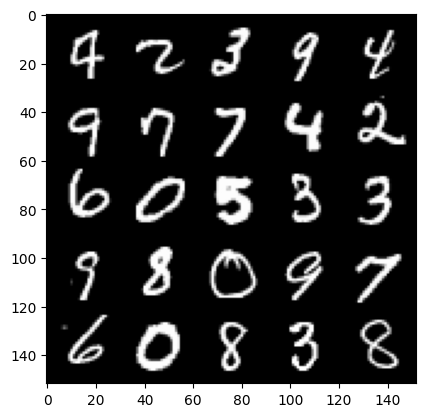

 58%|██████████████████████████████████████████████▌                                 | 273/469 [00:06<00:04, 39.86it/s]

Epoch 25, step 12000: Generator loss: 0.6908143891096111, discriminator loss: 0.6931476466655737


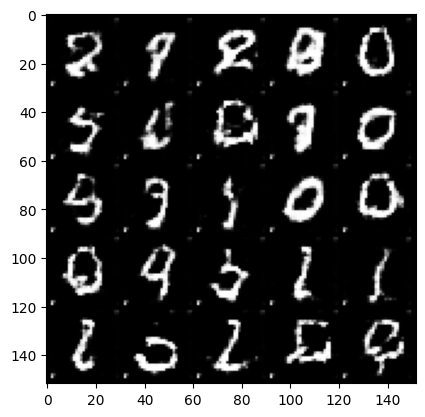

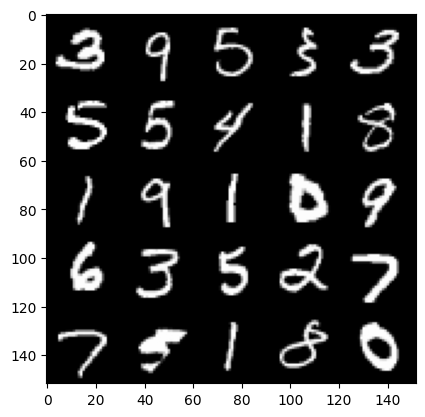

 65%|███████████████████████████████████████████████████▊                            | 304/469 [00:07<00:04, 40.01it/s]

Epoch 26, step 12500: Generator loss: 0.6931113417148589, discriminator loss: 0.6931590218544003


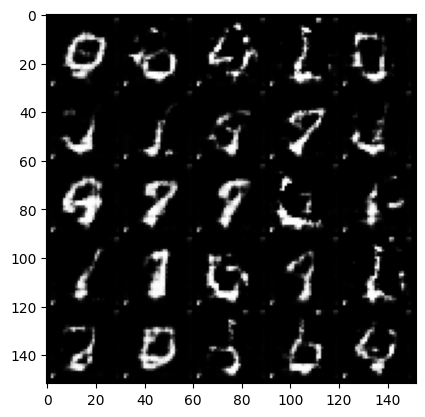

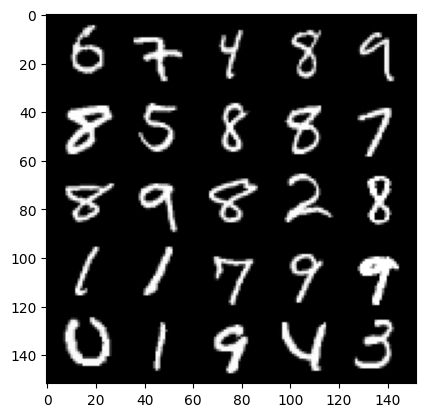

 72%|█████████████████████████████████████████████████████████▍                      | 337/469 [00:08<00:03, 39.83it/s]

Epoch 27, step 13000: Generator loss: 0.6927469257116323, discriminator loss: 0.693159042716026


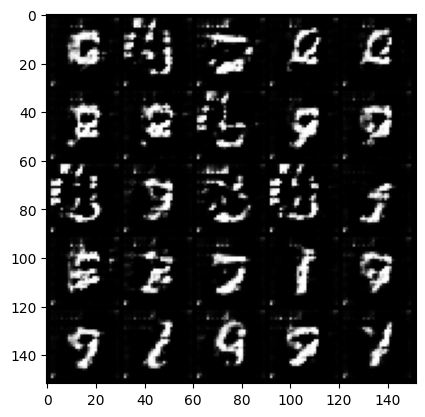

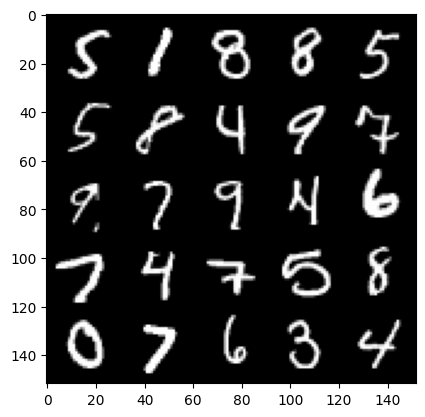

 78%|██████████████████████████████████████████████████████████████▌                 | 367/469 [00:09<00:02, 39.81it/s]

Epoch 28, step 13500: Generator loss: 0.6930916224718097, discriminator loss: 0.6931628149747852


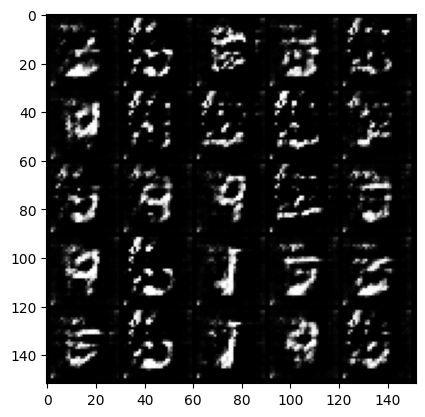

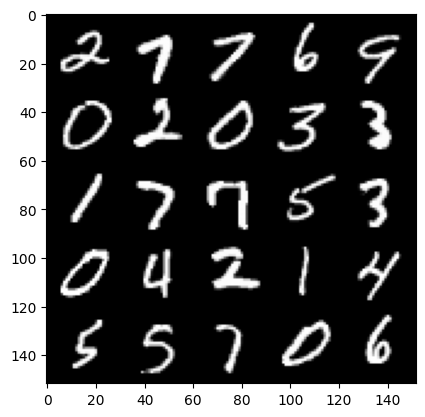

 85%|████████████████████████████████████████████████████████████████████            | 399/469 [00:10<00:01, 39.23it/s]

Epoch 29, step 14000: Generator loss: 0.693079386115073, discriminator loss: 0.6931744817495346


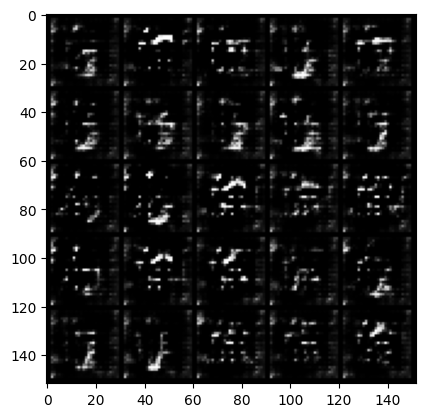

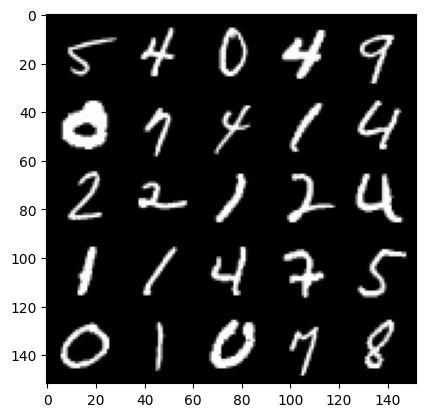

 92%|█████████████████████████████████████████████████████████████████████████▎      | 430/469 [00:10<00:01, 38.78it/s]

Epoch 30, step 14500: Generator loss: 0.6930984510183333, discriminator loss: 0.6931622670888907


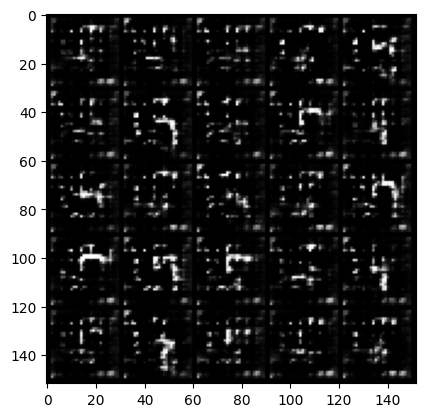

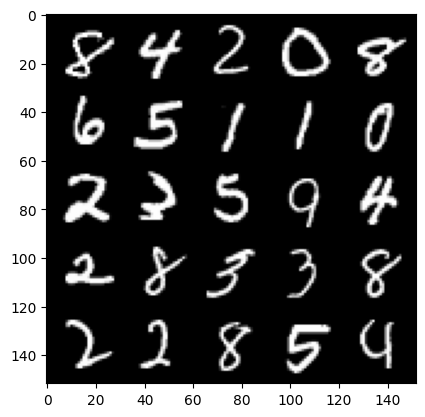

 98%|██████████████████████████████████████████████████████████████████████████████  | 458/469 [00:11<00:00, 39.29it/s]

Epoch 31, step 15000: Generator loss: 0.6930994575023659, discriminator loss: 0.6931526149511336


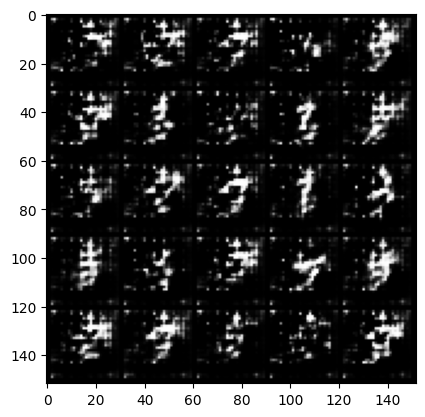

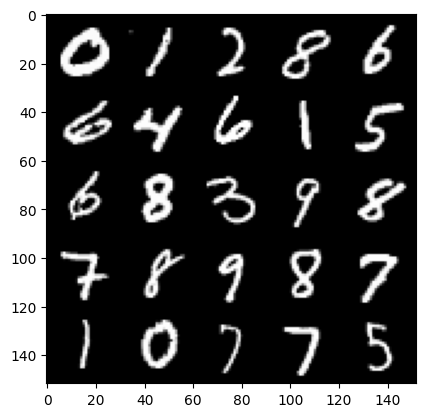

  4%|███▍                                                                             | 20/469 [00:00<00:11, 38.89it/s]

Epoch 33, step 15500: Generator loss: 0.693126335382462, discriminator loss: 0.6931515983343123


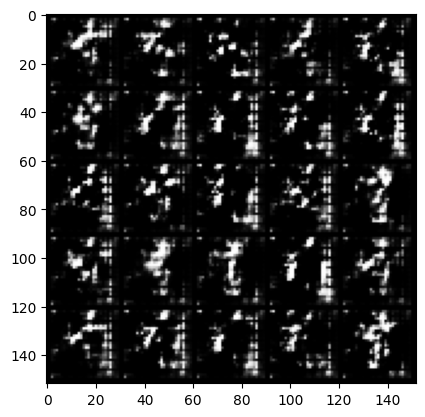

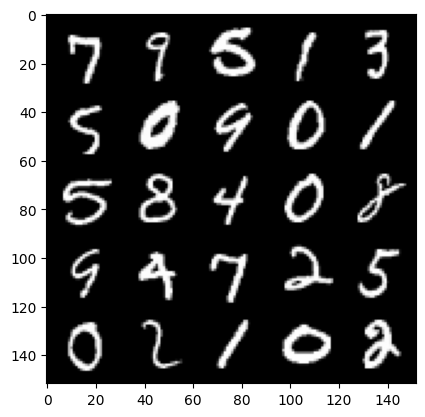

 12%|█████████▎                                                                       | 54/469 [00:01<00:10, 39.39it/s]

Epoch 34, step 16000: Generator loss: 0.6931271618604661, discriminator loss: 0.6931512429714203


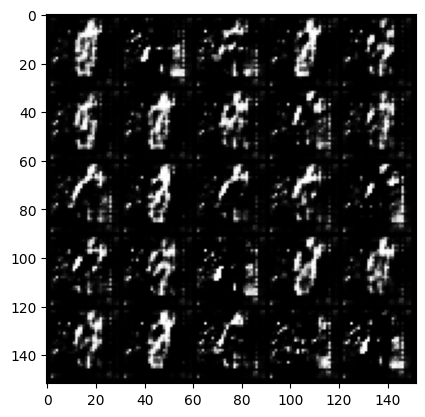

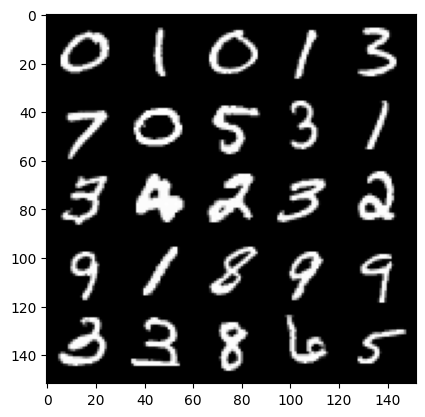

 17%|█████████████▉                                                                   | 81/469 [00:02<00:09, 40.00it/s]

Epoch 35, step 16500: Generator loss: 0.6931357867717745, discriminator loss: 0.693149183273314


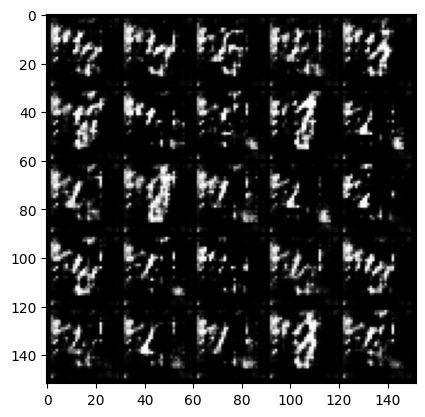

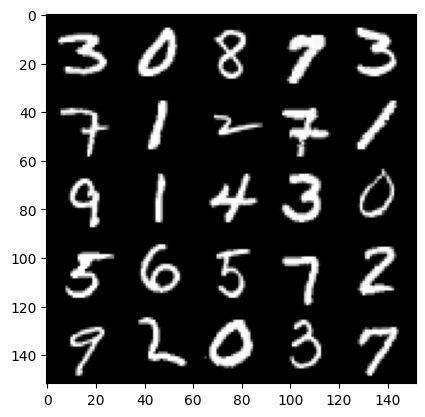

 25%|███████████████████▌                                                            | 115/469 [00:02<00:09, 39.06it/s]

Epoch 36, step 17000: Generator loss: 0.6931370038986211, discriminator loss: 0.6931479003429442


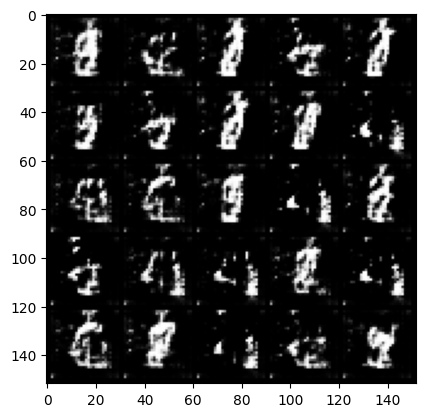

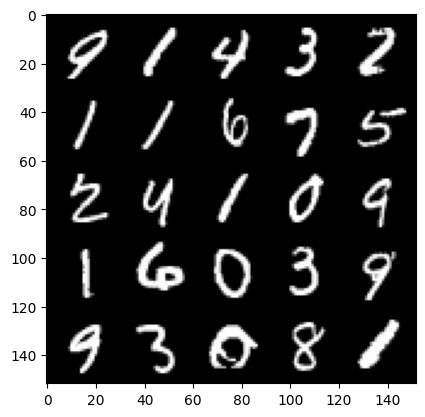

 31%|████████████████████████▌                                                       | 144/469 [00:03<00:08, 39.38it/s]

Epoch 37, step 17500: Generator loss: 0.6931431645154955, discriminator loss: 0.6931476118564635


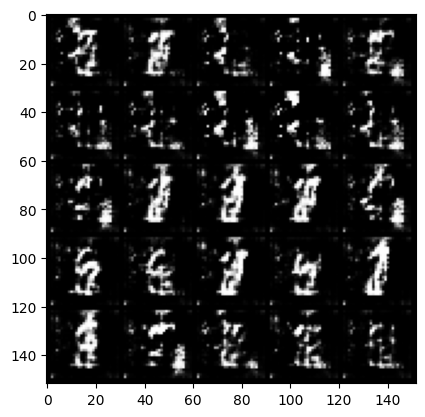

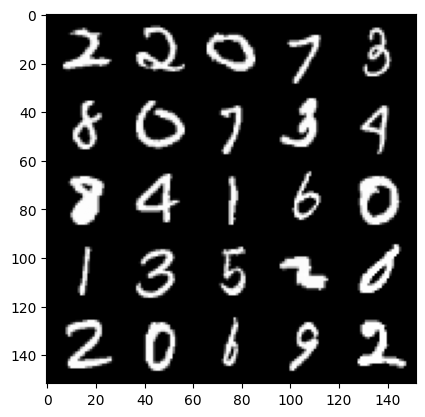

 37%|█████████████████████████████▊                                                  | 175/469 [00:04<00:07, 38.98it/s]

Epoch 38, step 18000: Generator loss: 0.6931369209289556, discriminator loss: 0.6931478015184411


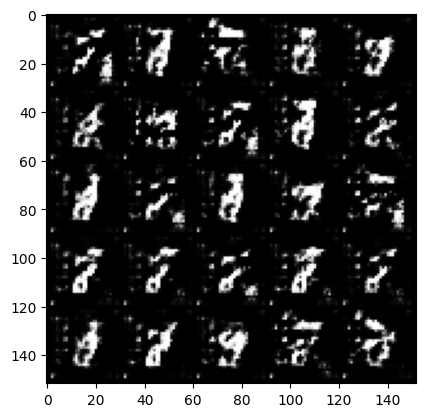

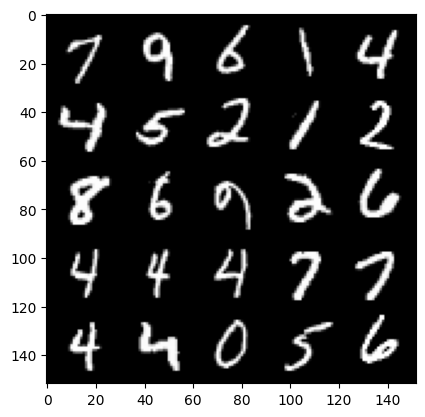

 44%|███████████████████████████████████▎                                            | 207/469 [00:05<00:06, 38.10it/s]

Epoch 39, step 18500: Generator loss: 0.6931382161378862, discriminator loss: 0.6931478246450435


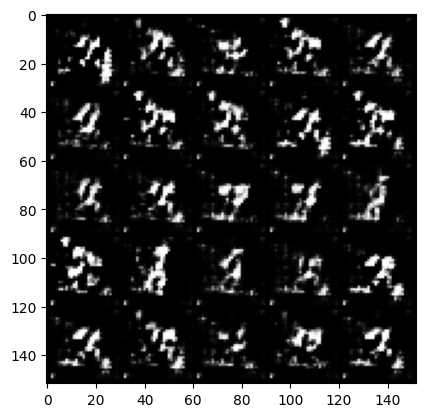

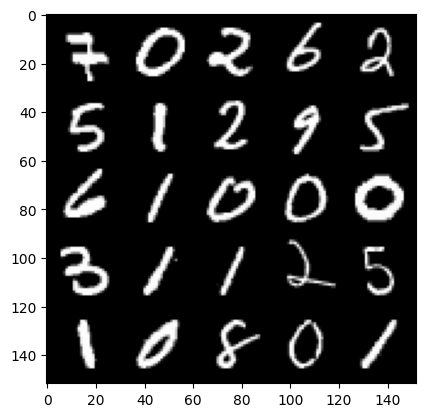

 51%|████████████████████████████████████████▍                                       | 237/469 [00:06<00:05, 39.80it/s]

Epoch 40, step 19000: Generator loss: 0.6928340069055555, discriminator loss: 0.6932833076715457


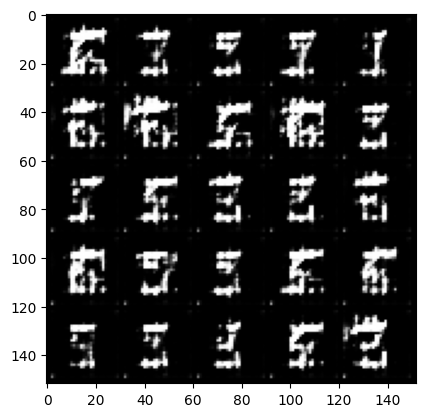

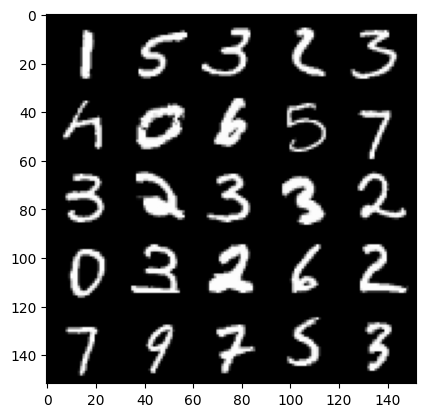

 58%|██████████████████████████████████████████████                                  | 270/469 [00:06<00:05, 38.49it/s]

Epoch 41, step 19500: Generator loss: 0.6930740064382555, discriminator loss: 0.6931824246644972


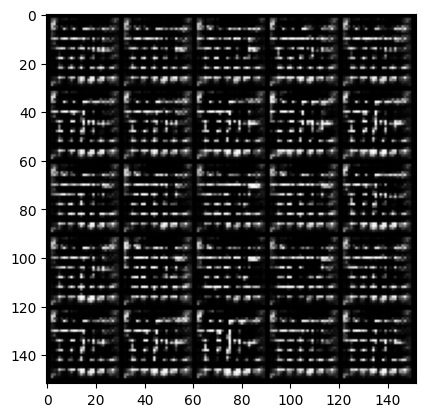

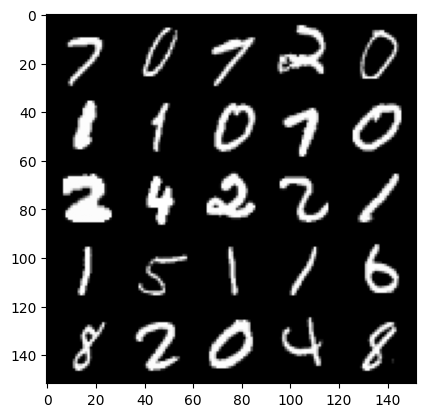

 64%|███████████████████████████████████████████████████                             | 299/469 [00:07<00:04, 37.09it/s]

Epoch 42, step 20000: Generator loss: 0.693130456805229, discriminator loss: 0.6931553158760071


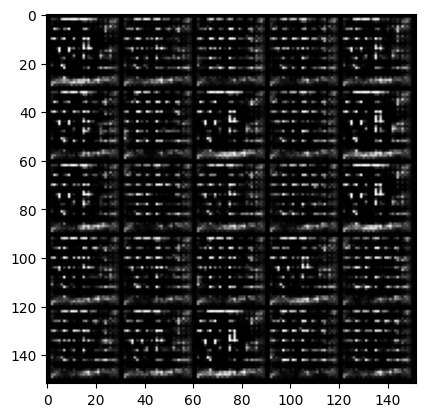

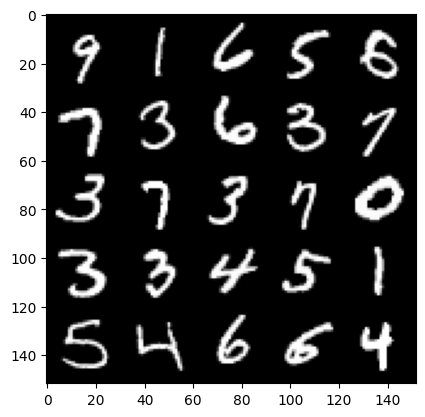

 71%|████████████████████████████████████████████████████████▊                       | 333/469 [00:08<00:03, 40.06it/s]

Epoch 43, step 20500: Generator loss: 0.6931297082901003, discriminator loss: 0.6931553559303276


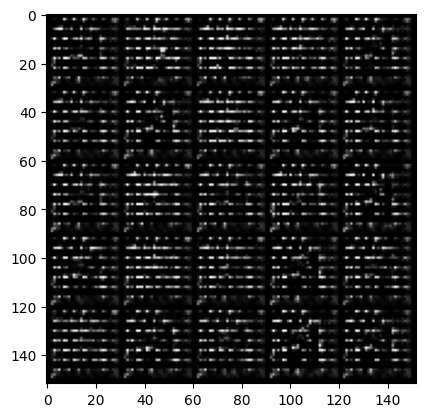

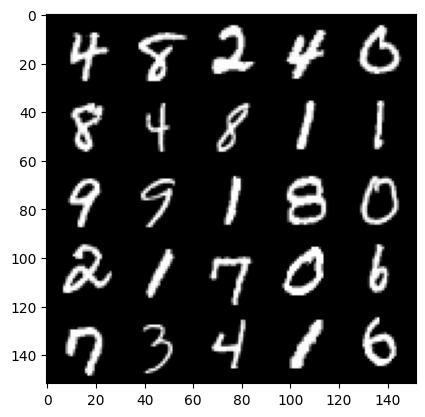

 78%|██████████████████████████████████████████████████████████████                  | 364/469 [00:09<00:02, 39.70it/s]

Epoch 44, step 21000: Generator loss: 0.6931411081552514, discriminator loss: 0.6931492279767995


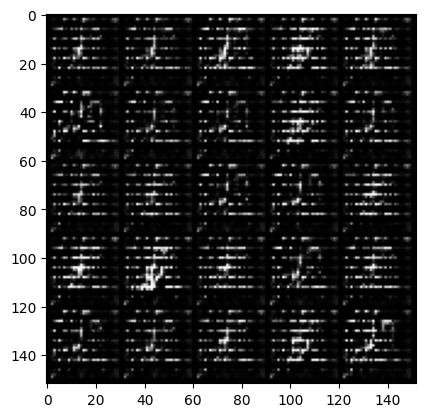

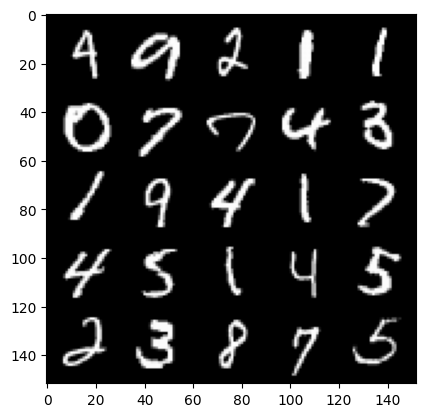

 84%|███████████████████████████████████████████████████████████████████▍            | 395/469 [00:10<00:01, 39.77it/s]

Epoch 45, step 21500: Generator loss: 0.6931408097743998, discriminator loss: 0.6931497477293023


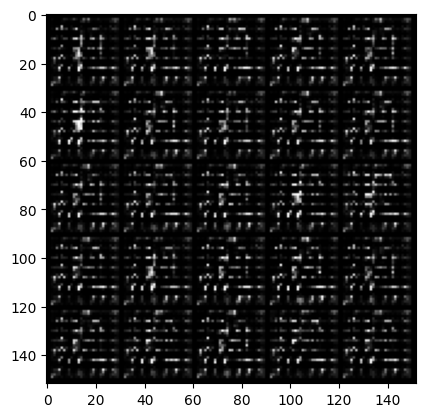

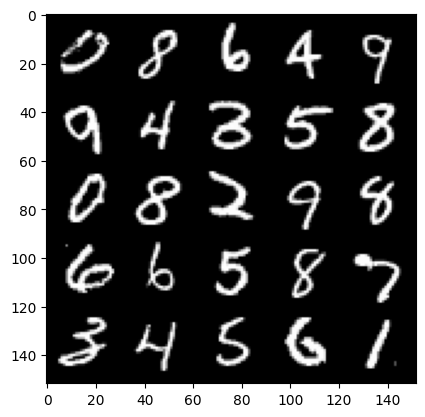

 91%|████████████████████████████████████████████████████████████████████████▍       | 425/469 [00:10<00:01, 40.28it/s]

Epoch 46, step 22000: Generator loss: 0.6931392508745193, discriminator loss: 0.6931509702205669


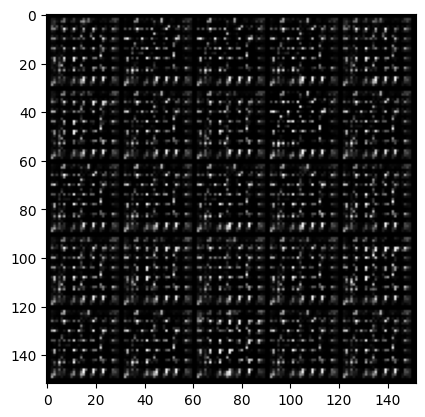

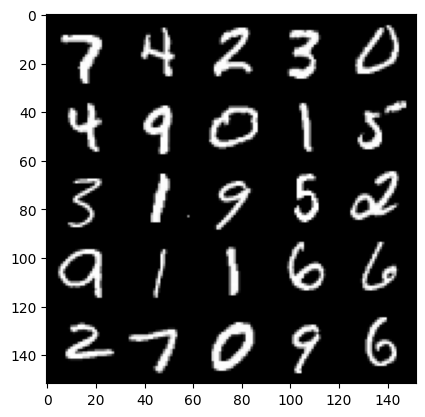

 97%|█████████████████████████████████████████████████████████████████████████████▍  | 454/469 [00:11<00:00, 39.69it/s]

Epoch 47, step 22500: Generator loss: 0.6931425942182543, discriminator loss: 0.693149238228797


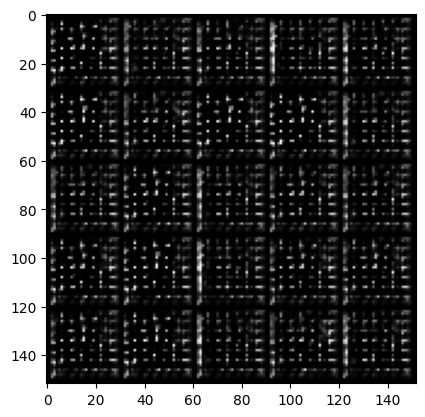

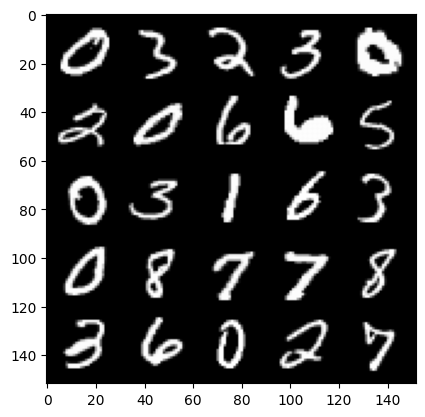

  3%|██▊                                                                              | 16/469 [00:00<00:12, 37.02it/s]

Epoch 49, step 23000: Generator loss: 0.6931436254978185, discriminator loss: 0.6931485172510157


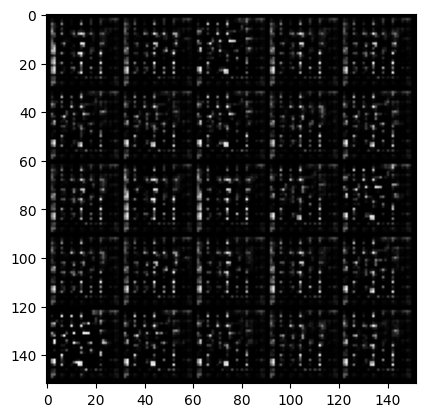

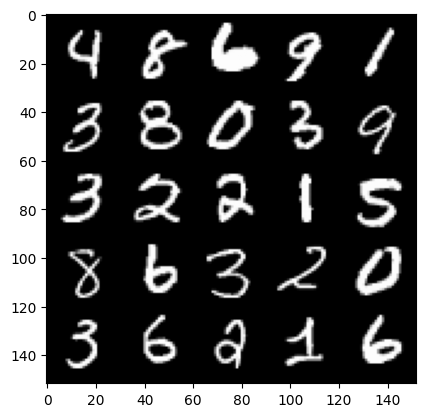

100%|████████████████████████████████████████████████████████████████████████████████| 469/469 [00:12<00:00, 38.52it/s]


In [6]:
n_epochs = 50
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        ## Update discriminator ##
        disc_opt.zero_grad()
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        fake = gen(fake_noise)
        disc_fake_pred = disc(fake.detach())
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_pred = disc(real)
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step
        # Update gradients
        disc_loss.backward(retain_graph=True)
        # Update optimizer
        disc_opt.step()

        ## Update generator ##
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        disc_fake_pred = disc(fake_2)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ## Visualization code ##
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1